In [1]:
import numpy as np
import matplotlib.pyplot as plt
import flika as flk
flk.start_flika()
from matplotlib.gridspec import GridSpec
from flika.window import Window as flw
import matplotlib 
from scipy.ndimage.filters import median_filter
from dask.array import coarsen
from fish.image.zds import to_dask, ZDS
from fish.util.distributed import get_jobqueue_cluster
from dask.distributed import Client
from fish.util.plot import depth_project
import pickle
matplotlib.rc('font', family='arial')
matplotlib.rc('font', size=8)
matplotlib.rc('axes', titlesize=8)
matplotlib.rc('axes', labelsize=8)
matplotlib.rc('xtick', labelsize=8)
matplotlib.rc('ytick', labelsize=8)
matplotlib.rc('legend', fontsize=8)

from fish.ephys.ephys import estimate_onset, windowed_variance, estimate_swims, load
from pathlib import Path
from fish.image.alignment import estimate_translation
from h5py import File
from skimage.exposure import rescale_intensity as rescale
from fish.util.plot import apply_cmap
from scipy.signal import fftconvolve
from scipy.stats import zscore
from matplotlib.patches import Rectangle
from mpl_toolkits.axes_grid1 import make_axes_locatable
fig_dir = '../../figures/ch2/'
%matplotlib inline

Starting flika
Starting flika inside IPython


In [2]:
def scale_bar(x0, y0, width, height, um_per_pixel):
    from matplotlib.patches import Rectangle    
    from matplotlib.text import Text
    from numpy import array
    
    pix_units = array(um_per_pixel)
    width_um = array([width, height])
    origin_um = array([x0,y0])
    
    scb_dims = width_um / pix_units
    origin = origin_um / pix_units
    
    rect = Rectangle(origin, *scb_dims, fill=True, edgecolor=None, facecolor='w')
    text = Text(rect.xy[0], rect.xy[1] - (3 * scb_dims[1]) / 2, f'{width} μm', color='w')
    
    return rect, text

def axs_format(ax):
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    
def shift_yx(im, shifts, block_id):
    from scipy.ndimage.interpolation import shift
    t = block_id[0]    
    return shift(im.astype('float32'), (0,0, *shifts[t]), order=1, cval=100)

def reg(fixed, moving):
    from fish.image.alignment import estimate_translation    
    from numpy import expand_dims
    affs =  estimate_translation(fixed.squeeze(), moving.squeeze()).affine
    return expand_dims(affs, 0)

def prune(data, thresholds):
    from numpy import bincount
    out = data.copy()
    sizes = bincount(out.ravel())
    
    lower = sizes < thresholds[0]
    lower_mask = lower[data]
    
    upper = sizes > thresholds[1]
    upper_mask = upper[data]
    
    out[lower_mask] = 0
    out[upper_mask] = 0
    
    return out

def mdp(data, axis, cmap):
    from skimage.exposure import rescale_intensity as rescale
    from matplotlib.cm import get_cmap
    from numpy import argmax, linspace, zeros
    # max project to get intensity, then use depth to set color
    mx = rescale(data.max(axis).astype('float'), out_range=(0,1))
    remapped = zeros((*mx.shape[1:], 4))
    dp = argmax(data, axis)    
    col_array = get_cmap(cmap)(linspace(0, 1, data.shape[axis]))
    remapped = (col_array[dp,:].transpose(2,1,0) * mx.T).transpose(2,1,0)
    
    return remapped
    
def slices_to_rect(slices, full_shape, **kwargs):
    from matplotlib.patches import Rectangle
    from numpy import arange
    inds = arange(full_shape[0])[slices[0]], arange(full_shape[1])[slices[1]]
    origin = inds[1][0], inds[0][0]
    width = inds[1][-1] - inds[1][0]
    height = inds[0][-1] - inds[0][0]
    return Rectangle(origin, width, height, **kwargs)

def linreg(v, regressors):
    from sklearn.linear_model import LinearRegression
    from fish.image.vol import redim
    from numpy import concatenate
    
    def sse(a,b,axis=0):
        return ((a - b)**2).sum(axis)
    
    # assumes v is samples x features
    v_ = redim(v, 2)
    lr = LinearRegression(normalize=True, n_jobs=1).fit(regressors, v_)
    
    coefs = lr.coef_.T.reshape((regressors.shape[1], *v.shape[1:]))
    
    pred = lr.predict(regressors)
    scores = 1 - (sse(v_, pred) / sse(v_, v_.mean(0)))        
    scores = scores.reshape((1, *v.shape[1:]))
    
    return concatenate([coefs, scores], 0).astype('float32')

def guess_experimenter(path):
    experimenter = None
    if path.find('Yu') >= 0:
        experimenter = 'yu'
    elif path.find('davis') >= 0:
        experimenter = 'davis'
    return experimenter

def mydff(v, fs_im):
    from fish.image.vol import dff
    camera_offset = 100
    window = 300 * fs_im
    percentile = 20
    offset = 10    
    downsample = 10;
    return dff((v - camera_offset).clip(1, None), window, percentile, offset, downsample, axis=0).astype('float32')

In [3]:
from fish.util.distributed import get_jobqueue_cluster
cluster = get_jobqueue_cluster()
client = Client(cluster)
client

/groups/ahrens/home/bennettd/miniconda/lib/python3.6/site-packages/distributed/deploy/local.py:138: UserWarning: diagnostics_port has been deprecated. Please use `dashboard_address=` instead
  "diagnostics_port has been deprecated. "


Client Scheduler: tcp://10.36.111.13:34641 Dashboard: http://10.36.111.13:8787/status,Cluster Workers: 0 Cores: 0 Memory: 0 B


In [4]:
base_dirs = ('/nrs/ahrens/davis/data/spim/raw/20160608/6dpf_cy171xcy221_f1_omr_1_20160608_170933/',
             '/nrs/ahrens/Yu/SPIM/active_dataset/glia_neuron_imaging/20170228/fish3/20170228_3_1_gfaprgeco_hucgc_6dpf_shorttrials_20170228_165730/raw/',
            '/nrs/ahrens/Yu/SPIM/active_dataset/glia_neuron_imaging/20170221/fish5/20170221_5_3_gfaprgeco_hucgc_6dpf_wholebrain_20170221_223941/raw/',
            '/nrs/ahrens/Yu/SPIM/active_dataset/glia_neuron_imaging/20170221/fish4/20170221_4_2_gfaprgeco_hucgc_6dpf_wholebrain_20170221_163236/raw/', 
            '/nrs/ahrens/Yu/SPIM/active_dataset/glia_neuron_imaging/20170203/fish1/20170203_1_4_gfapgcamp_hucrgeco_8dpf_wholebrain_CL_0gain_modulation_20170203_122038/raw/',
            '/nrs/ahrens/Yu/SPIM/active_dataset/glia_neuron_imaging/20170228/fish4/20170228_4_1_gfaprgeco_hucgc_6dpf_shorttrials_20170228_185002/raw/')

In [ ]:
params = {ZDS(f_).metadata['data_header'] : ZDS(f_).metadata['volume_rate'] for f_ in base_dirs}

In [6]:
def get_dset(path):
    from pathlib import Path
    from os.path import exists
    from scipy.ndimage.filters import median_filter
    experimenter = guess_experimenter(path)
    if experimenter == 'davis':
        reg_path = path.replace('raw', 'proc') + 'reg/regparams_affine.npy'        
        dset = ZDS(path)
        
    elif experimenter == 'yu':
        rootdir = str(Path(path).parent) + '/'
        reg_path = rootdir + 'regparams_affine.npy'
        if not exists(reg_path):
            reg_path = rootdir + 'regparams_affine_ds2.npy'
        dset = ZDS(path)
        
    shifts = -np.load(reg_path)[:,:-1,-1]
    shifts = median_filter(shifts, size=(int(200 / dset.metadata['volume_rate']), 1))        
    dset.affines = shifts
    
    return dset

In [7]:
dsets = {}
for fn in base_dirs:
    tmp = get_dset(fn)
    dsets[tmp.metadata['data_header']] = tmp

In [8]:
exp_name, dset = (*dsets.items(),)[0]
data = dset.data
fs_im = dset.metadata['volume_rate']
print(dset.shape)
print(exp_name)

(5000, 37, 2048, 2048)
6dpf_cy171xcy221_f1_omr_1


In [9]:
import attr
@attr.s
class exp_param():
    roi = attr.ib()
    roi_g = attr.ib()
    roi_n = attr.ib()
    swim_ch = attr.ib()
    ep_file = attr.ib()
    swimclip = attr.ib()

class PipelinedArray():
    def __init__(self, data, image_func, time_func, dtype='float32'):
        self.data = data
        self.image_func = image_func
        self.time_func = time_func
        self.dtype = dtype        
        self.output = self._compose_output()
        
    def __getitem__(self, idx):
        return PipelinedArray(self.data[idx], self.image_func, self.time_func, self.dtype)
    
    def compute(self, **kwargs):
        return self.output.compute(**kwargs)
    
    def _compose_output(self):
        output = self.data.map_blocks(self.image_func, dtype=self.dtype)
        output = output.rechunk((-1,'auto','auto','auto'))
        output = output.map_blocks(self.time_func, dtype=self.dtype)
        return output

In [10]:
expp = []

if exp_name == '6dpf_cy171xcy221_f1_omr_1':
    roi = slice(2000, None), slice(None), slice(None), slice(None)
    sample_anat = data[roi][0].compute(scheduler='threads')
    roi_g = roi[0], slice(None), slice(1024,None), slice(None)
    roi_n = roi[0], slice(None), slice(0, 1024), slice(None)
    swim_ch = 0
    ep_file = '/nrs/ahrens/davis/data/ephys/20160608/6dpf_cy171xcy221_f1_omr_1.10chFlt'
    swimclip = (.0015, None)
    
    expp = exp_param(roi=roi, 
                     roi_g=roi_g, 
                     roi_n=roi_n, 
                     swim_ch=swim_ch, 
                     ep_file=ep_file, 
                     swimclip=swimclip)
    
    epd = load(ep_file)
    
    tx = estimate_translation(sample_anat[roi_g[1:]].max(0), sample_anat[roi_n[1:]].max(0))
    # correct for some error in the estimated translation
    tx.affine[1,-1] = -32.531
    
    
elif exp_name == '20170228_3_1_gfaprgeco_hucgc_6dpf_shorttrials':
    roi = slice(100,None), slice(None), slice(None), slice(None)
    sample_anat = data[roi][0].compute(scheduler='threads')
    roi_g = roi[0], slice(None), slice(0, 1024), slice(None)
    roi_n = roi[0], slice(None), slice(1024, None), slice(None)
    tx = estimate_translation(sample_anat[roi_g[1:]].max(0), sample_anat[roi_n[1:]].max(0))
    
    ep_file = str(Path(dset.path).parent) + '/ephys/rawdata.mat'
    swim_ch = 1
    swimclip = None
    
    expp = exp_param(roi=roi, 
                     roi_g=roi_g, 
                     roi_n=roi_n, 
                     swim_ch=swim_ch, 
                     ep_file=ep_file, 
                     swimclip=swimclip)
    
    with File(ep_file) as f:
       epd = np.stack([f['rawdata'][k][:].squeeze() for k in f['rawdata'].keys()])
    
elif exp_name == '20170221_5_3_gfaprgeco_hucgc_6dpf_wholebrain':
    roi = slice(100,5800), slice(None), slice(None), slice(None)
    sample_anat = data[roi][0].compute(scheduler='threads')
    roi_g = roi[0], slice(None), slice(0, 1024), slice(None)
    roi_n = roi[0], slice(None), slice(1024, None), slice(None)
    tx = estimate_translation(sample_anat[roi_g[1:]].max(0), sample_anat[roi_n[1:]].max(0))
    ep_file = str(Path(dset.path).parent) + '/ephys/rawdata.mat'
    swim_ch = 1
    swimclip = None
    
    expp = exp_param(roi=roi, 
                     roi_g=roi_g, 
                     roi_n=roi_n, 
                     swim_ch=swim_ch, 
                     ep_file=ep_file, 
                     swimclip=swimclip)
    
    with File(ep_file) as f:
       epd = np.stack([f['rawdata'][k][:].squeeze() for k in f['rawdata'].keys()])

elif exp_name == '20170203_1_4_gfapgcamp_hucrgeco_8dpf_wholebrain_CL_0gain_modulation':
    roi = slice(100, 8400), slice(None), slice(None), slice(None)
    sample_anat = data[roi][0].compute(scheduler='threads')
    roi_g = roi[0], slice(None), slice(1024, None), slice(None)
    roi_n = roi[0], slice(None), slice(0, 1024), slice(None)
    tx = estimate_translation(sample_anat[roi_g[1:]].max(0), sample_anat[roi_n[1:]].max(0))
    ep_file = str(Path(dset.path).parent) + '/ephys/rawdata.mat'
    swim_ch = 1
    swimclip = None
    
    expp = exp_param(roi=roi, 
                     roi_g=roi_g, 
                     roi_n=roi_n, 
                     swim_ch=swim_ch, 
                     ep_file=ep_file, 
                     swimclip=swimclip)
    
    with File(ep_file) as f:
       epd = np.stack([f['rawdata'][k][:].squeeze() for k in f['rawdata'].keys()])
    
elif exp_name == '20170228_4_1_gfaprgeco_hucgc_6dpf_shorttrials':
    roi = slice(100,7100), slice(None), slice(None), slice(None)
    sample_anat = data[roi][0].compute(scheduler='threads')
    roi_n = roi[0], slice(None), slice(1024,None), slice(None)
    roi_g = roi[0], slice(None), slice(0, 1024), slice(None)
    tx = estimate_translation(sample_anat[roi_g[1:]].max(0), sample_anat[roi_n[1:]].max(0))
    ep_file = str(Path(dset.path).parent) + '/ephys/rawdata.mat'
    swim_ch = 1
    swimclip = None
    
    expp = exp_param(roi=roi, 
                     roi_g=roi_g, 
                     roi_n=roi_n, 
                     swim_ch=swim_ch, 
                     ep_file=ep_file, 
                     swimclip=swimclip)
    
    with File(ep_file) as f:
       epd = np.stack([f['rawdata'][k][:].squeeze() for k in f['rawdata'].keys()])
    
elif exp_name == '20170221_4_2_gfaprgeco_hucgc_6dpf_wholebrain':
    roi = slice(100,6000), slice(None), slice(None), slice(None)
    sample_anat = data[roi][0].compute(scheduler='threads')
    roi_n = roi[0], slice(None), slice(1024,None), slice(None)
    roi_g = roi[0], slice(None), slice(0, 1024), slice(None)
    tx = estimate_translation(sample_anat[roi_g[1:]].max(0), sample_anat[roi_n[1:]].max(0))
    ep_file = str(Path(dset.path).parent) + '/ephys/rawdata.mat'
    swim_ch = 1
    swimclip = None
    
    expp = exp_param(roi=roi, 
                     roi_g=roi_g, 
                     roi_n=roi_n, 
                     swim_ch=swim_ch, 
                     ep_file=ep_file, 
                     swimclip=swimclip)
    
    with File(ep_file) as f:
       epd = np.stack([f['rawdata'][k][:].squeeze() for k in f['rawdata'].keys()])


In [11]:
swim = windowed_variance(epd[expp.swim_ch])[0]
cam = estimate_onset(epd[2], 3.8, 100)[:dset.shape[0]]
fs_ep = 6000
x_ep = np.arange(*cam[expp.roi[0]][[0,-1]])
x_im = cam[expp.roi[0]]

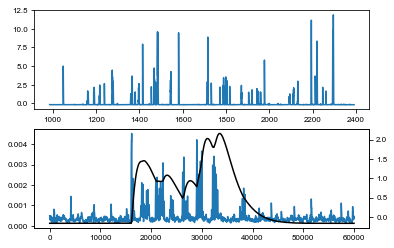

In [29]:
kern_t = np.linspace(0, 1, 18000)
a,b = 10, 9
spike_kern = ((a * b) / (a - b)) * (np.exp(-b * kern_t) - np.exp(-a * kern_t))
spike_kern = np.pad(spike_kern, (len(spike_kern),0), mode='constant')

test = np.zeros(2 * len(spike_kern))
test[len(spike_kern)] = 1

est = estimate_swims(swim)
ons, offs = np.where(est[0])[0], np.where(est[1])[0]
bout_durs = offs-ons
dur_thr = 1000
keep = np.where(bout_durs > dur_thr)[0]
ons = ons[keep]
offs=offs[keep]
ibis = np.zeros(len(ons))
ibis[0] = ons[0]
ibis[:-1] = ons[1:] - offs[:-1]
ibi_thresh = fs_ep * 5

if swimclip:
    swim_clipped = swim.clip(*swimclip)
else:
    swim_clipped = swim
swim_regressor = zscore(fftconvolve(swim_clipped, spike_kern, mode='same'))
fig, axs = plt.subplots(nrows=2)
axs[0].plot(x_ep / fs_ep, swim_regressor[x_ep])
plr = slice(200 * 6000, 6000 * 210)
axs[1].plot(swim[x_ep][plr])
axs[1].twinx().plot(swim_regressor[x_ep][plr], color='k')

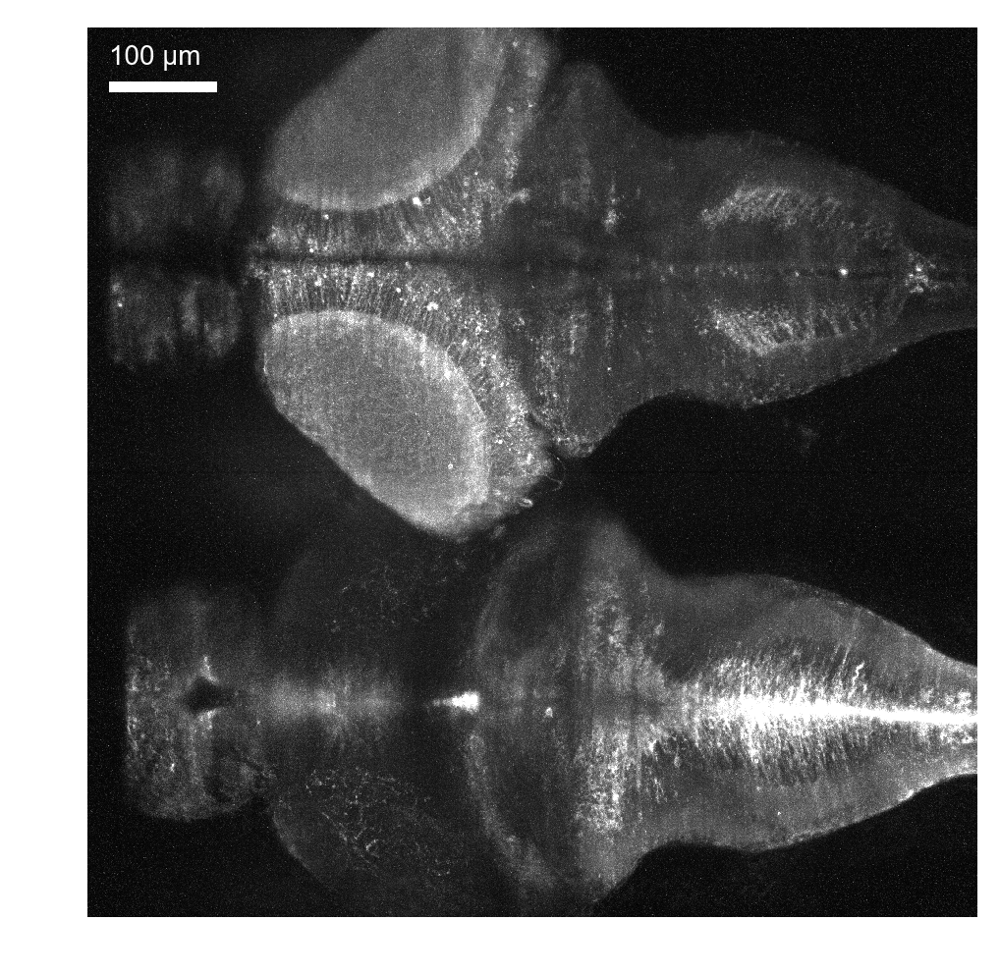

In [30]:
fig, axs = plt.subplots(figsize=(6,6), dpi=200)
axs.imshow(sample_anat.max(0), cmap='gray', clim=(100,230))
scb_text, scb_rect = scale_bar(20, 50, 100, 10, .40265)
axs.add_artist(scb_text)
axs.add_artist(scb_rect)
axs.axis('off')
plt.savefig(fig_dir + exp_name + '_2color_max_proj.pdf')

In [31]:
cluster.start_workers(30)
means = data[expp.roi_g].mean((1,2,3)), data[expp.roi_n].mean((1,2,3))
mean_g, mean_n = client.compute(means, sync=True)
cluster.stop_all_jobs()

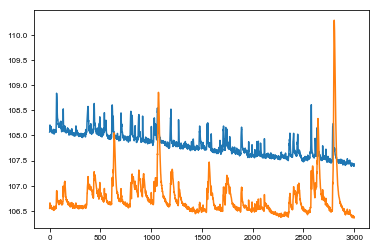

In [32]:
plt.plot(mean_n)
plt.plot(mean_g)

In [33]:
glia_mean_regressor = zscore(mydff(mean_g, fs_im))
neuron_mean_regressor = zscore(mydff(mean_n, fs_im))
regressors = np.stack([swim_regressor[x_im], glia_mean_regressor, neuron_mean_regressor],1)

/groups/ahrens/home/bennettd/fish/fish/image/vol.py:69: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  data_ds = data[slices]


In [34]:
ds_xy = 4
plr_zoom = slice(2550, 2900)
data_tx = dset.data[expp.roi][plr_zoom].map_blocks(shift_yx, dset.affines[plr_zoom], dtype='float32')
data_filt = data_tx.map_blocks(lambda v: median_filter(v, size=(1,1,3,3)))
data_ds = coarsen(np.mean, data_filt, {2: ds_xy, 3: ds_xy})
rechunked = data_ds.rechunk(chunks=(-1, -1, -1, 'auto'))
fs_im = dset.metadata['volume_rate']
data_dff = rechunked.map_blocks(lambda v: mydff(v, fs_im=fs_im), dtype='float32')

In [35]:
cluster.start_workers(50)
dff = data_dff.compute()
cluster.stop_all_jobs()

In [38]:
dff.shape

(350, 37, 512, 512)

In [64]:
anat = coarsen(np.mean, dset.data[:10].mean(0).max(0),{0:ds_xy, 1:ds_xy}).compute(scheduler='threads')

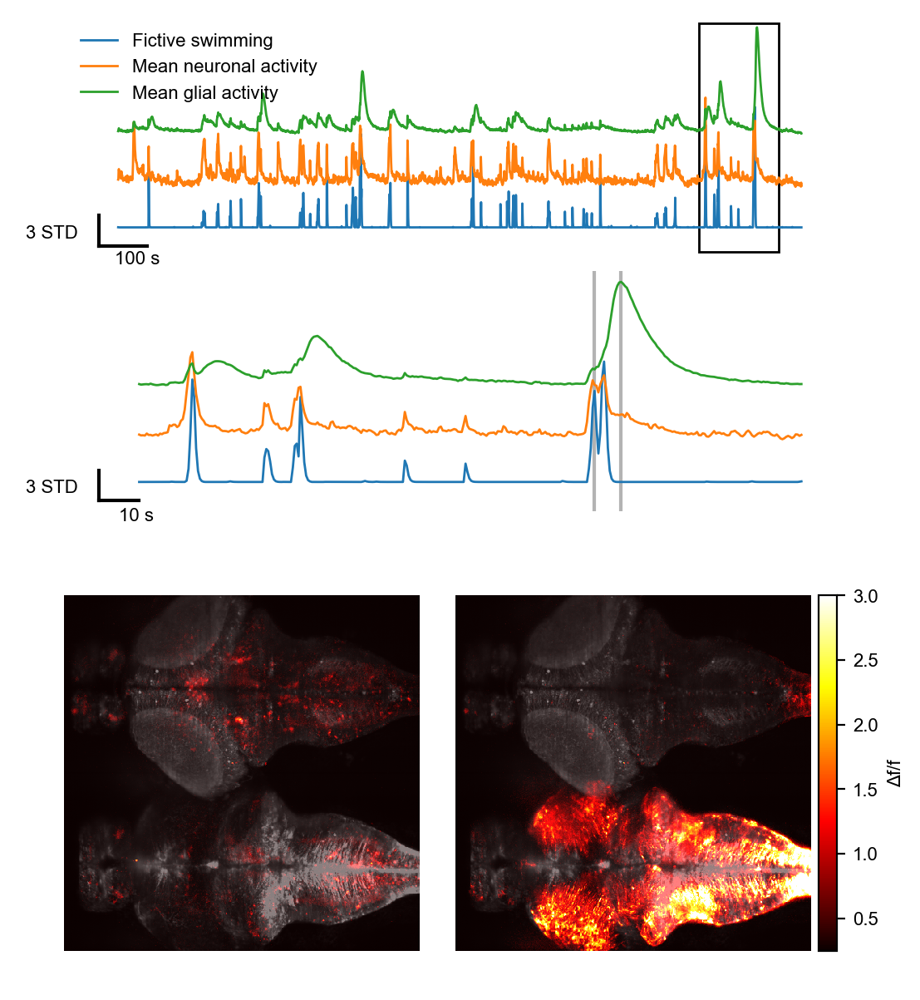

In [77]:
fig = plt.figure(dpi=200, figsize=(6,8))
gs = GridSpec(nrows=12, ncols=12)

#fig, axs = plt.subplots(figsize=(6,4), dpi=200, nrows=2, ncols=2, gridspec_kw={'width_ratios' : (1,1)})
plr_full = slice(None)

x_axis = np.arange(regressors.shape[0]) / fs_im

full_ts_ax = fig.add_subplot(gs[:3,:])
zoom_ts_ax = fig.add_subplot(gs[3:6,:])
sample_image_axs = fig.add_subplot(gs[6:,:6]), fig.add_subplot(gs[6:,6:])

full_ts_ax.plot(x_axis[plr_full], regressors[plr_full, np.array([0,2,1])] + (np.arange(3) * 5), linewidth=1)
full_ts_ax.lines[0].set_label('Fictive swimming')
full_ts_ax.lines[1].set_label('Mean neuronal activity')
full_ts_ax.lines[2].set_label('Mean glial activity')
full_ts_ax.axis('off')

scb_x_len = 100
scb_y_len = 3
scb_x = np.array([0, scb_x_len]) - 40 + x_axis[plr_full][0]
scb_y = np.array([0, scb_y_len]) - 2
full_ts_ax.plot(2*[scb_x[0]],scb_y, color='k', zorder=0)
full_ts_ax.plot(scb_x, 2*[scb_y[0]], color='k', zorder=0)
full_ts_ax.text(scb_x[0]-scb_x_len * 1.5, scb_y[0] + (scb_y_len)/4, f'{(scb_y_len)} STD', fontsize=8)
full_ts_ax.text(scb_x[0] + scb_x_len/3, scb_y[0] - 1.8, f'{(scb_x_len):} s', fontsize=8)
full_ts_ax.legend(frameon=False, loc='upper left')

rect_ori = (x_axis[plr_full][plr_zoom][np.array([0])], full_ts_ax.get_ylim()[0] + .5)
zoomrect = Rectangle(rect_ori,  len(x_axis[plr_full][plr_zoom]) / fs_im, np.diff(full_ts_ax.get_ylim()) * .95, fill=False)
full_ts_ax.add_patch(zoomrect)

zoom_ts_ax.plot(x_axis[plr_zoom], regressors[plr_zoom, np.array([0,2,1])] + (np.arange(3) * 5), linewidth=1)
zoom_ts_ax.axis('off')
dff_clim = (.25,3)
scb_x_len = 10
scb_y_len = 3
scb_x = np.array([0, scb_x_len]) - 10 + x_axis[plr_zoom][0]
scb_y = np.array([0, scb_y_len]) - 2
zoom_ts_ax.plot(2*[scb_x[0]],scb_y, color='k', zorder=0)
zoom_ts_ax.plot(scb_x, 2*[scb_y[0]], color='k', zorder=0)
zoom_ts_ax.text(scb_x[0]- scb_x_len * 1.8, scb_y[0] + (scb_y_len)/4, f'{(scb_y_len)} STD', fontsize=8)
zoom_ts_ax.text(scb_x[0] + scb_x_len/2, scb_y[0] - 2, f'{(scb_x_len):} s', fontsize=8)

g_pk = np.argmax(glia_mean_regressor[plr_zoom])
sample_inds = (g_pk - 14, g_pk)
[zoom_ts_ax.axvline((ind_ + plr_zoom.start) / fs_im, color=(.7,.7,.7), zorder=0) for ind_ in sample_inds]
anat_ = apply_cmap(anat, cmap='gray', clim=(100,280)) / 2

sample_image_axs[0].imshow(apply_cmap(dff[sample_inds[0]].max(0), cmap='hot', clim=dff_clim) + anat_)
#sample_image_axs[1].imshow(dff[sample_inds[1]].max(0), cmap='inferno', clim=dff_clim)
sample_image_axs[1].imshow(dff[sample_inds[1]].max(0), cmap='hot', clim=dff_clim)
sample_image_axs[1].imshow(apply_cmap(dff[sample_inds[1]].max(0), cmap='hot', clim=dff_clim)  + anat_)
tmp_ax = make_axes_locatable(sample_image_axs[0]).append_axes("right", size="5%", pad=0.05)
tmp_ax.axis('off')
cax = make_axes_locatable(sample_image_axs[-1]).append_axes("right", size="5%", pad=0.05)
plt.colorbar(sample_image_axs[1].images[0], cax=cax)
cax.set_ylabel('Δf/f')
[ax.axis('off') for ax in sample_image_axs]
plt.savefig(fig_dir + dset.exp_name + '_regressor_timeseries.pdf')

In [77]:
ds_xy = 2
data_tx = dset.data.map_blocks(shift_yx, dset.affines, dtype='float32')
data_filt = data_tx.map_blocks(lambda v: median_filter(v, size=(1,1,7,7)))
data_ds = coarsen(np.mean, data_filt, {2: ds_xy, 3: ds_xy})

rechunked = data_ds[expp.roi].rechunk(chunks=(-1, 'auto','auto','auto'))
data_dff = rechunked.map_blocks(lambda v: mydff(v, fs_im), dtype='float32')

In [78]:
cluster.start_workers(400)
regressors_bc = client.scatter(regressors, broadcast=True)
linreg_result = data_dff.map_blocks(linreg, regressors_bc, dtype='float32').compute()
cluster.stop_all_jobs()

In [79]:
linreg_fname = f'../../data/ch2/{exp_name}_linreg_result.pickle'

In [80]:
if ds_xy >= 1:
    from skimage.transform import resize
    linreg_result = np.stack([resize(r, output_shape=(sample_anat.shape)) for r in linreg_result])

/groups/ahrens/home/bennettd/miniconda/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/groups/ahrens/home/bennettd/miniconda/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


In [81]:
from os import remove
from os.path import exists
if exists(linreg_fname):
    remove(linreg_fname)

In [82]:
with open(linreg_fname, 'xb') as f:
    pickle.dump((regressors, linreg_result), f)

In [140]:
with open(linreg_fname, 'rb') as f:
    regressors, linreg_result = pickle.load(f)

# Get all the linear regression results

In [12]:
from glob import glob
linreg_result_fnames = glob('../../data/ch2/*_linreg_result.pickle')

In [13]:
lr_result_pop = {}
for fn in linreg_result_fnames:
    key = fn.split('_linreg_result')[0].split('/')[-1]
    with open(fn, 'rb') as f:
        lr_result_pop[key] = pickle.load(f)
keys = (*lr_result_pop.keys(),)

In [14]:
from scipy.signal import correlate
xcorrs = [zscore(correlate(regr[0][:,1], regr[0][:,2])) for regr in lr_result_pop.values()]
xcorrs_d = [zscore(correlate(np.gradient(regr[0][:,1]), np.gradient(regr[0][:,2]))) for regr in lr_result_pop.values()]

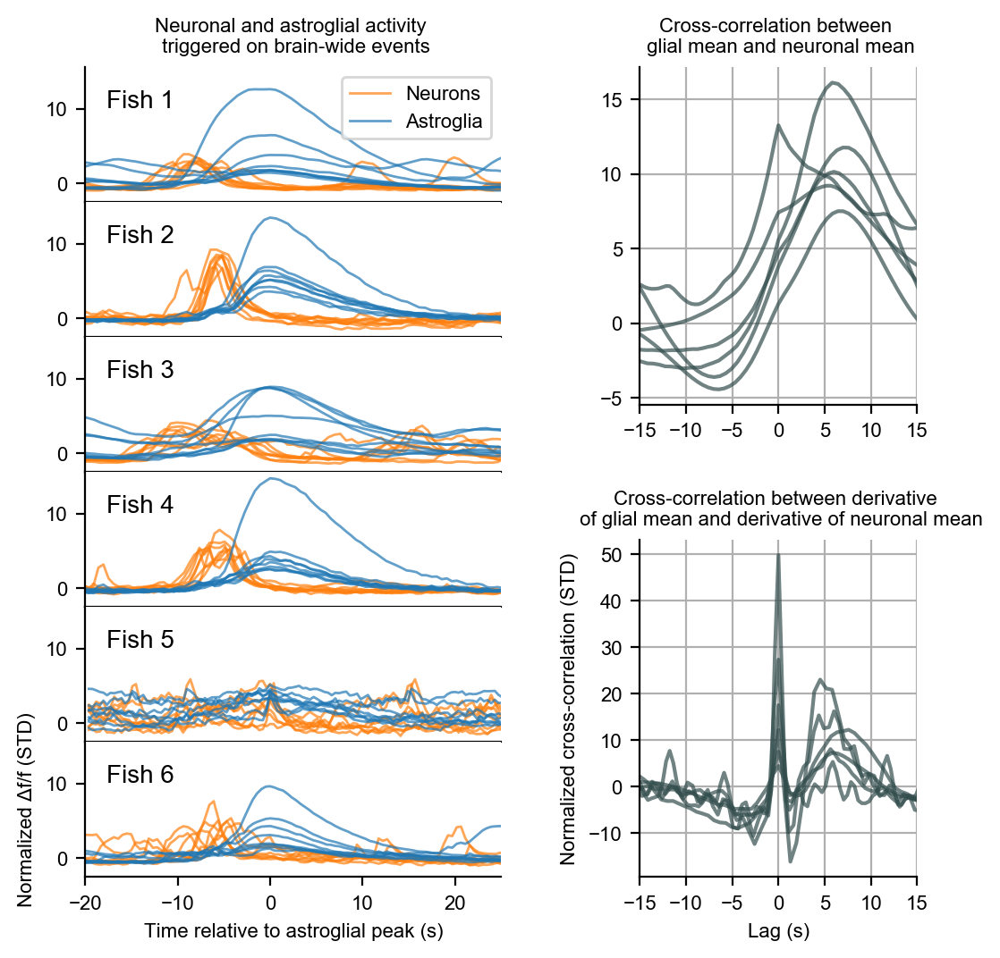

In [57]:
import peakutils as pk
from matplotlib.gridspec import GridSpec as gs

cols = plt.rcParams['axes.prop_cycle'].by_key()['color']

window_ts = np.arange(-50,70)

wve_dsets = keys
#wve_dsets = keys[1], keys[4], keys[2], keys[0], keys[-1]

fig = plt.figure(figsize=(6,6), dpi=200)
num_ax = 2 * len(wve_dsets) 
axs_g = gs(ncols=num_ax, nrows=num_ax, figure=fig, wspace=0, hspace=0)
axs_traces = []
for ind in range(len(wve_dsets)):
    if ind == 0:
        axs_traces.append(fig.add_subplot(axs_g[2 * ind: 2 * (ind + 1),:num_ax//2])) 
    else:
        axs_traces.append(fig.add_subplot(axs_g[2 * ind: 2 * (ind + 1),:num_ax//2], sharey=axs_traces[0])) 
wves = [lr_result_pop[w][0] for w in wve_dsets]
indices = [pk.indexes(w[:,1], min_dist=50, thres=.15) for w in wves]
indices = [i[i+window_ts[-1] < wves[ind].shape[0]] for ind, i in enumerate(indices)]
indices = [i[np.argsort(wves[ind][i,1])][::-1][:8] for ind, i in enumerate(indices)]
for ind, w in enumerate(wves):
    axs_traces[ind].plot(window_ts / params[keys[ind]], w[window_ts + indices[ind].reshape(-1,1)][:,:,2].T, color=cols[1], linewidth=1, label='Neurons', alpha=.7)
    axs_traces[ind].plot(window_ts / params[keys[ind]], w[window_ts + indices[ind].reshape(-1,1)][:,:,1].T, color=cols[0], linewidth=1,label='Astroglia', alpha=.7)
    axs_traces[ind].set_xlim(-20,25)
    axs_traces[ind].text(.05,.7,f'Fish {ind + 1}', transform = axs_traces[ind].transAxes)
axs_traces[0].title.set_text('Neuronal and astroglial activity \n triggered on brain-wide events')
axs_traces[0].legend([axs_traces[0].lines[0],axs_traces[0].lines[-1]], ['Neurons', 'Astroglia'])
axs_traces[-1].set_ylabel('Normalized Δf/f (STD)')
axs_traces[-1].set_xlabel('Time relative to astroglial peak (s)')
[ax.set_xticks([]) for ax in axs_traces[:-1]]
[axs_format(ax) for ax in axs_traces]
 
keys = list(lr_result_pop.keys())

axs_xc = [fig.add_subplot(axs_g[:len(wve_dsets)-1,(num_ax//2) + 2:]), 
          fig.add_subplot(axs_g[len(wve_dsets) + 1:,(num_ax//2) + 2:])]
[ax.grid(True) for ax in axs_xc]
offsets = [len(x) for x in xcorrs]
windows_xc = [np.arange(-40,41) + len(xc)//2 for xc in xcorrs]
xc_color = (.2,.3,.3)
[axs_xc[0].plot((windows_xc[ind] - offsets[ind]//2)/ params[keys[ind]], xc[windows_xc[ind]],color=xc_color, alpha=.7) for ind, xc in enumerate(xcorrs)]
[axs_xc[1].plot((windows_xc[ind] - offsets[ind]//2)/ params[keys[ind]], xc[windows_xc[ind]],color=xc_color, alpha=.7) for ind, xc in enumerate(xcorrs_d)]
[axs.set_xlim(-15,15) for axs in axs_xc]

axs_xc[-1].set_xlabel('Lag (s)')
axs_xc[-1].set_ylabel('Normalized cross-correlation (STD)')
ticks = axs_xc[-1].get_xticks()
axs_xc[0].set_xticks(np.arange(-15, 20, 5))
axs_xc[-1].set_xticks(np.arange(-15, 20, 5))
[axs_format(ax) for ax in axs_xc]
axs_xc[0].title.set_text('Cross-correlation between \n glial mean and neuronal mean')
axs_xc[1].title.set_text('Cross-correlation between derivative \n of glial mean and derivative of neuronal mean')

plt.savefig(fig_dir + 'mean_correlation.pdf')

[None, None, None, None, None, None, None, None, None, None]

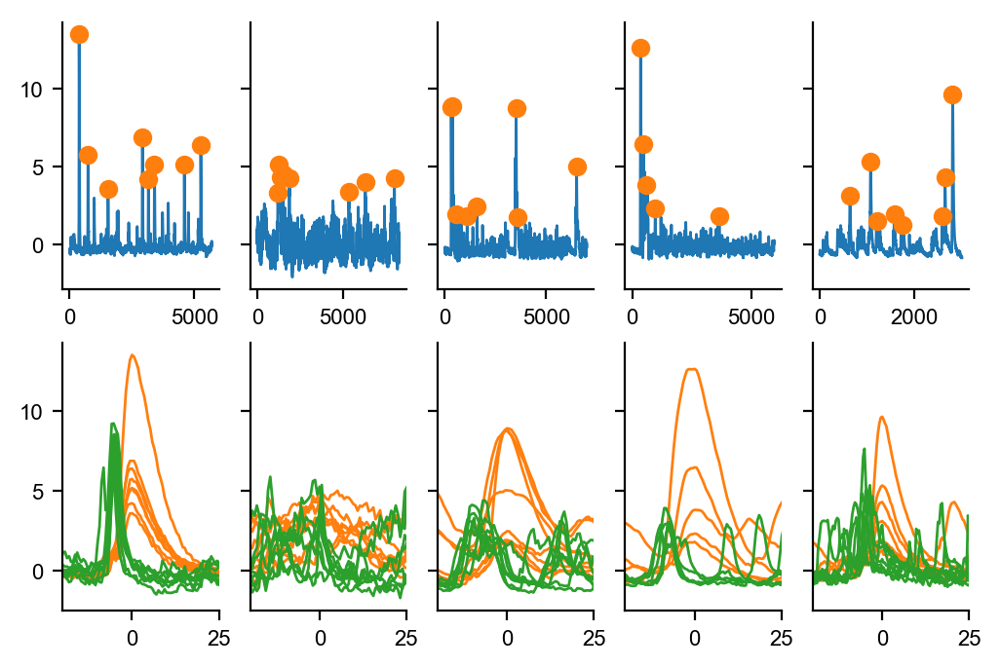

In [17]:
cols = plt.rcParams['axes.prop_cycle'].by_key()['color']
import peakutils as pk
window = np.arange(-50,70)

plr = slice(0,None)
wve_dsets = keys[1], keys[4], keys[2], keys[0], keys[-1]
fig, axs = plt.subplots(nrows=2, ncols=len(wve_dsets), figsize=(6,4), dpi=200, sharey='row')

wves = [lr_result_pop[w][0] for w in wve_dsets]
indices = [pk.indexes(w[:,1][plr], min_dist=50, thres=.2) for w in wves]
indices = [i[i+window[-1] < wves[ind].shape[0]] for ind, i in enumerate(indices)]
indices = [i[np.argsort(wves[ind][i,1])][::-1][:8] for ind, i in enumerate(indices)]
for ind, w in enumerate(wves):
    axs[0,ind].plot(w[:,1][plr], linewidth=1)    
    axs[0,ind].plot(indices[ind], w[plr,1][indices[ind]],'o')
    #axs[1,ind].plot(w[window + indices[ind].reshape(-1,1)][:,:,0].T,'m', linewidth=1);
    axs[1,ind].plot(window / params[keys[ind]], w[window + indices[ind].reshape(-1,1)][:,:,1].T, color=cols[1], linewidth=1);
    axs[1,ind].plot(window / params[keys[ind]], w[window + indices[ind].reshape(-1,1)][:,:,2].T, color=cols[2], linewidth=1);
    axs[1,ind].set_xlim(-20,25)
[axs_format(ax) for ax in axs.ravel()]

In [50]:
import dask.array as da

roi_starts = [100, 100, 100, 100, 2000]
events = []
for curexp in range(len(wve_dsets)):

    indices_sorted = indices[curexp]
    pktimes = roi_starts[curexp] + indices_sorted
    pre, post = -20, 30
    dset = dsets[wve_dsets[curexp]]
    fs_im = dset.metadata['volume_rate']
    shifts = dset.affines
    data_tx = dset.data.map_blocks(shift_yx, shifts, dtype='float32')
    data_filt = data_tx.map_blocks(lambda v: median_filter(v, size=(1,1,7,7)))
    data_ds = da.coarsen(np.mean, data_filt, axes={2:2, 3:2}).astype('float32')
    data_events = (da.stack([data_ds[slice(pkt+pre, pkt+post)] for pkt in pktimes])).transpose(1,0,2,3,4)
    data_events_rechunked = data_events.rechunk((-1,'auto','auto','auto','auto'))
    data_events_dff = data_events_rechunked.map_blocks(lambda v: mydff(v, fs_im=1), dtype='float32')
    events.append(data_events_dff)
    

## All glial waves

In [47]:
events[0].shape

(50, 8, 21, 1024, 1024)

## First glial wave example

In [48]:
curexp = 2

In [51]:
cluster.start_workers(200)
dff_mx = [e[:,0].max(1).compute() for e in events]
cluster.stop_all_jobs()

In [209]:
anat = da.coarsen(np.mean, dsets[wve_dsets[curexp]].data[:10].mean(0).max(0), {0:2,1:2}).compute(scheduler='threads')

In [210]:
mx = event_dff[:,:,:,:512].max(0)
mn_g = event_dff[:,:,:,:512].mean((2,3,4))
mn_n = event_dff[:,:,:,512:].mean((2,3,4))

In [213]:
event_dff.shape

(50, 8, 29, 1024, 1024)

In [246]:
event_dff.shape

(50, 8, 29, 1024, 1024)

In [ ]:
plt.plot()

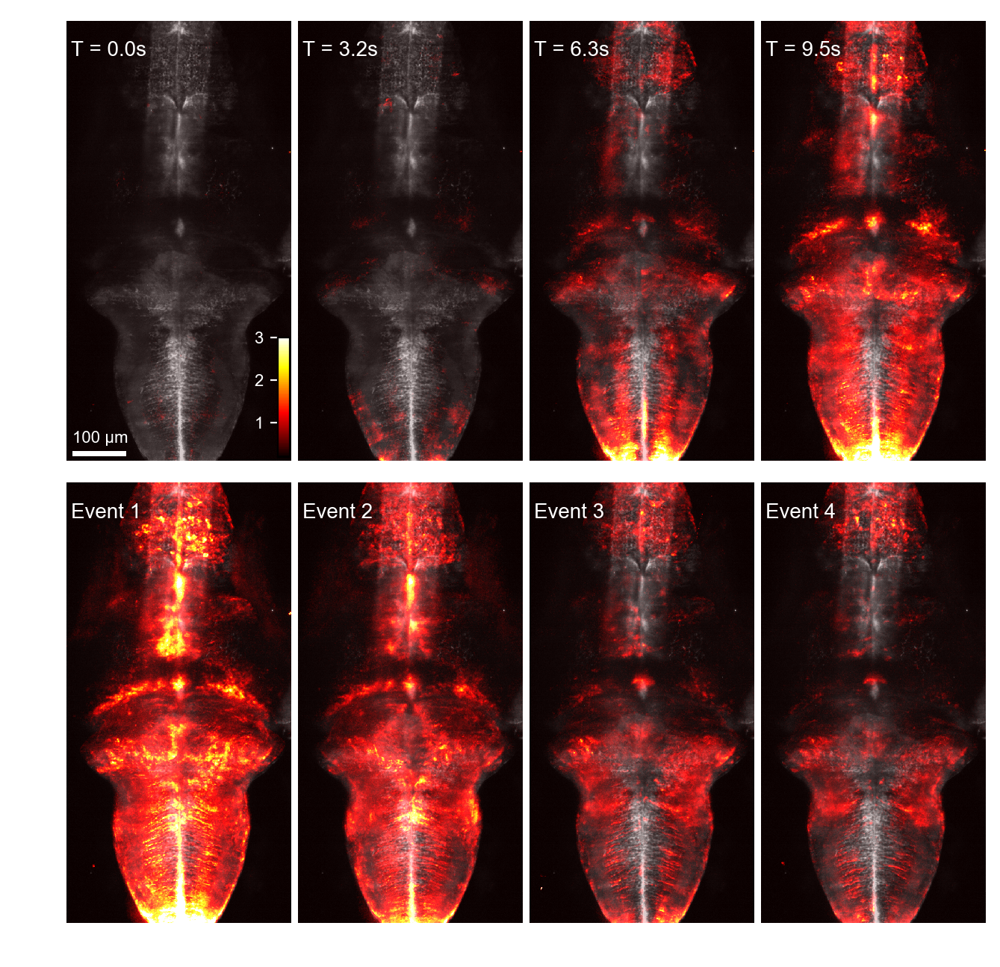

In [313]:
times = np.arange(2,22,5)
fs_im = params[keys[curexp]]
times_real = (times-times[0]) / fs_im
crop_g = slice(512), slice(0,-20)
fig, axs = plt.subplots(dpi=200, nrows=2, ncols=len(times), figsize=(8,8))
[ax.axis('off') for ax in axs.ravel()]
anat_im = apply_cmap(anat[crop_g], clim=(100,200), cmap='gray') * .8
dff_cmap = 'hot'
sample_events = [0,2,4,6]
[ax.set_facecolor('k') for ax in axs.ravel()]
dff_clim = (.2,3)
for ind, t in enumerate(times):
    ax_timepoint = axs[0][ind]
    ax_epoch = axs[1][ind]
    
    dff_im = apply_cmap(event_dff[t,0].max(0)[crop_g], clim=dff_clim, cmap=dff_cmap)    
    ax_timepoint.imshow((dff_im + anat_im).transpose(1,0,2))
    
    ax_timepoint.text(.02,.92,f'T = {times_real[ind]:.1f}s', color='w', transform=ax_timepoint.transAxes)
    dff_im = apply_cmap(event_dff[:,sample_events[ind],:,crop_g[0],crop_g[1]].max((0,1)), cmap=dff_cmap, clim=dff_clim)
    ax_epoch.text(.02,.92,f'Event {1 + ind}', color='w', transform=ax_epoch.transAxes)
    ax_epoch.imshow((dff_im + anat_im).transpose(1,0,2))
    
    
scb_rect, scb_text = scale_bar(10,790, 100, 10, .40265 * 2)
scb_text.set_fontsize(8)
axs[0][0].add_artist(scb_text)
axs[0][0].add_artist(scb_rect)
axs_cbar = fig.add_axes((.305,.505,.01,.12))
time_points = np.arange(event_dff[time_slice].shape[0]).reshape(-1,1)  / fs_im
axs_cbar.imshow(np.linspace(0,1,100).reshape(-1,1), extent=(0,np.diff(dff_clim)/10,dff_clim[0],dff_clim[-1]), cmap=dff_cmap, origin='lower')
axs_cbar.set_xticks([])
#axs_cbar.yaxis.tick_right()
axs_cbar.tick_params(axis='y', colors='w')

plt.subplots_adjust(wspace=0, hspace=.05)

(-0.5, 4095.5, 1023.5, -692.0843231201172)

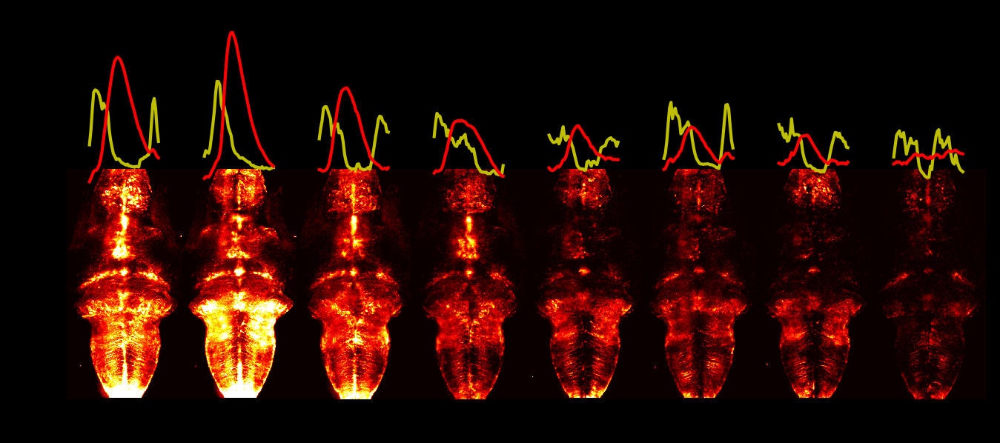

In [214]:
fig, axs=plt.subplots(figsize=(8,8), dpi=200, facecolor='k')
plt.imshow(mx[:,:].max(1).reshape(mx.shape[0] * mx.shape[2], mx.shape[3]).T, clim=(.2,2), cmap='hot')
for tr in range(mx.shape[0]):
    step = mx.shape[2]
    offset = mx.shape[2] * .2
    plt.plot(np.linspace(((step) * tr) + offset, ((step) * (tr + 1)) - offset, 50), -4000 * mn_n[:,tr],'y')
    plt.plot(np.linspace(((step) * tr) + offset, ((step) * (tr + 1)) - offset, 50), -4000 * mn_g[:,tr],'r')
axs.axis('off')

(-0.5, 4095.5, 1023.5, -350.7792404174805)

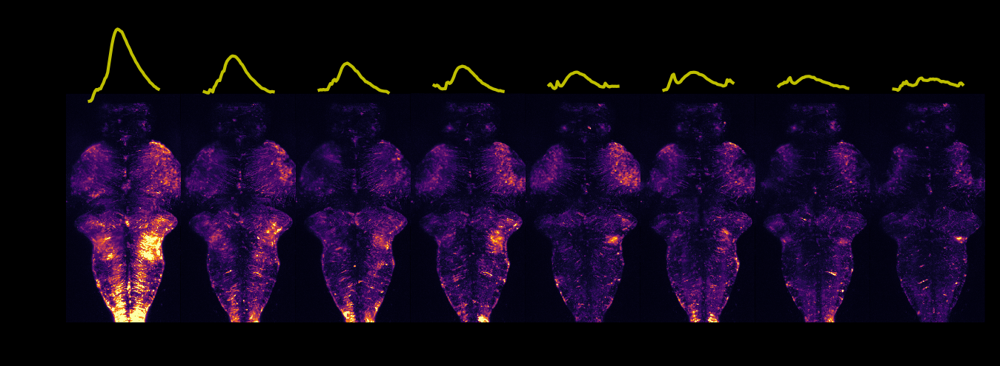

In [79]:
fig, axs=plt.subplots(figsize=(8,8), dpi=200, facecolor='k')
plt.imshow(mx[:,:].max(1).reshape(mx.shape[0] * mx.shape[2], mx.shape[3]).T, clim=(0,2), cmap='inferno')
for tr in range(mx.shape[0]):
    step = mx.shape[2]
    offset = mx.shape[2] * .2
    plt.plot(np.linspace(((step) * tr) + offset, ((step) * (tr + 1)) - offset, 50), -4000 * mn_g[:,tr],'y')
axs.axis('off')

(-0.5, 4095.5, 1023.5, -284.967667388916)

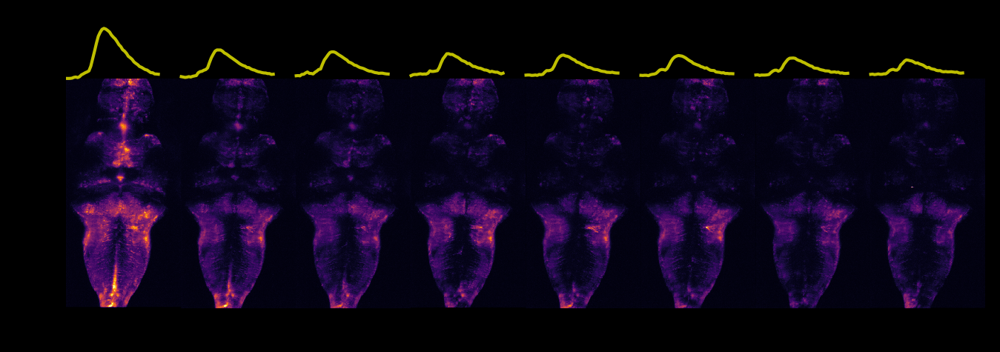

In [59]:
fig, axs=plt.subplots(figsize=(8,8), dpi=200, facecolor='k')
plt.imshow(mx[:,:].max(1).reshape(mx.shape[0] * mx.shape[2], mx.shape[3]).T, clim=(0,2), cmap='inferno')
for tr in range(mx.shape[0]):
    step = mx.shape[2] * .8
    offset = mx.shape[2] * .2
    plt.plot(np.linspace((step + offset) * tr, ((step + offset) * (tr + 1)) - offset, 50), -4000 * mn_g[:,tr],'y')
axs.axis('off')

In [45]:
fs_im = dsets[wve_dsets[curexp]].metadata['volume_rate']

In [29]:
mn = event_dff[:,0]

In [53]:
event_dff.shape

(50, 4, 21, 1024, 1024)

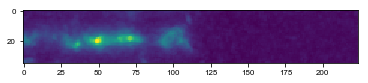

In [278]:
plt.imshow(event_dff[:,0,10,775:810,800:].max(0))

In [92]:
trm = event_dff.mean(1)

In [179]:
flw(np.concatenate([trm[:,-8, :512], trm[:,-5, :512]],1 ))

In [19]:
## Depth-projection of wave peaktime

In [20]:
wve_dsets

('20170221_5_3_gfaprgeco_hucgc_6dpf_wholebrain',
 '20170203_1_4_gfapgcamp_hucrgeco_8dpf_wholebrain_CL_0gain_modulation',
 '20170228_4_1_gfaprgeco_hucgc_6dpf_shorttrials',
 '20170228_3_1_gfaprgeco_hucgc_6dpf_shorttrials',
 '6dpf_cy171xcy221_f1_omr_1')

In [35]:
curexp=-1
fs_im = params[wve_dsets[curexp]]

In [22]:
cluster.start_workers(200)
event_dff = events[curexp].compute()
cluster.stop_all_jobs()

In [135]:
step = event_dff.shape[2] // 3
starts=np.arange(0, event_dff.shape[2] -step, step, dtype='int')
stops=np.arange(step, event_dff.shape[2], step, dtype='int')
slices = [slice(*z) for z in zip(starts, stops)]
time_slice = slice(5, None)
dps = []
cmap='jet'
for sl in slices[::-1]:
    dp = depth_project(event_dff[time_slice,0,sl,512:].max(1), clim=(.025,1), axis=0, cmap=cmap)
    dps.append(dp)
dps = np.array(dps)

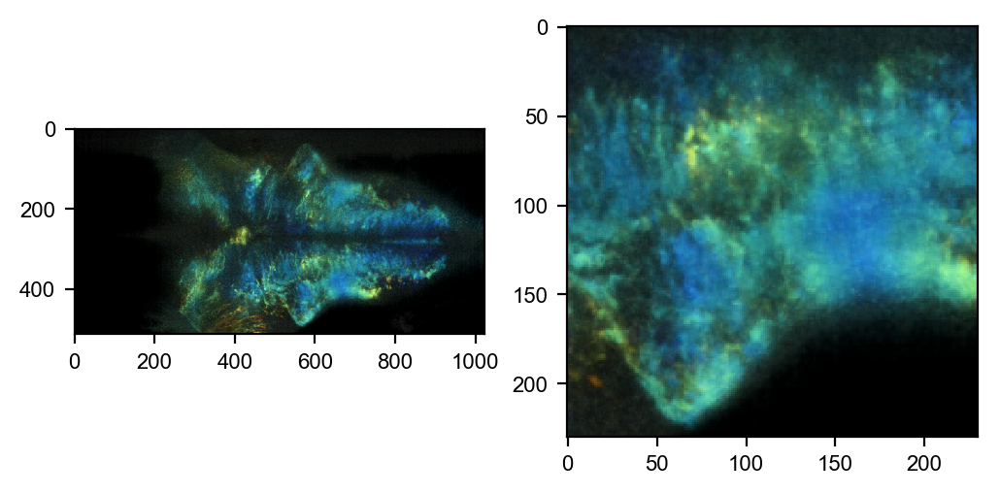

In [199]:
# (1,slice(100,-70), slice(600,1000), slice(None)),
zoomins = ((0, slice(200,470) , slice(460,730), slice(None)),            
          (1, slice(10,310), slice(200,500), slice(None)),
          (2, slice(270,500), slice(500,730), slice(None)))
            
fig, axs = plt.subplots(ncols=2, dpi=200)
axs[0].imshow(dps[2])
axs[1].imshow(dps[zoomins[2]])

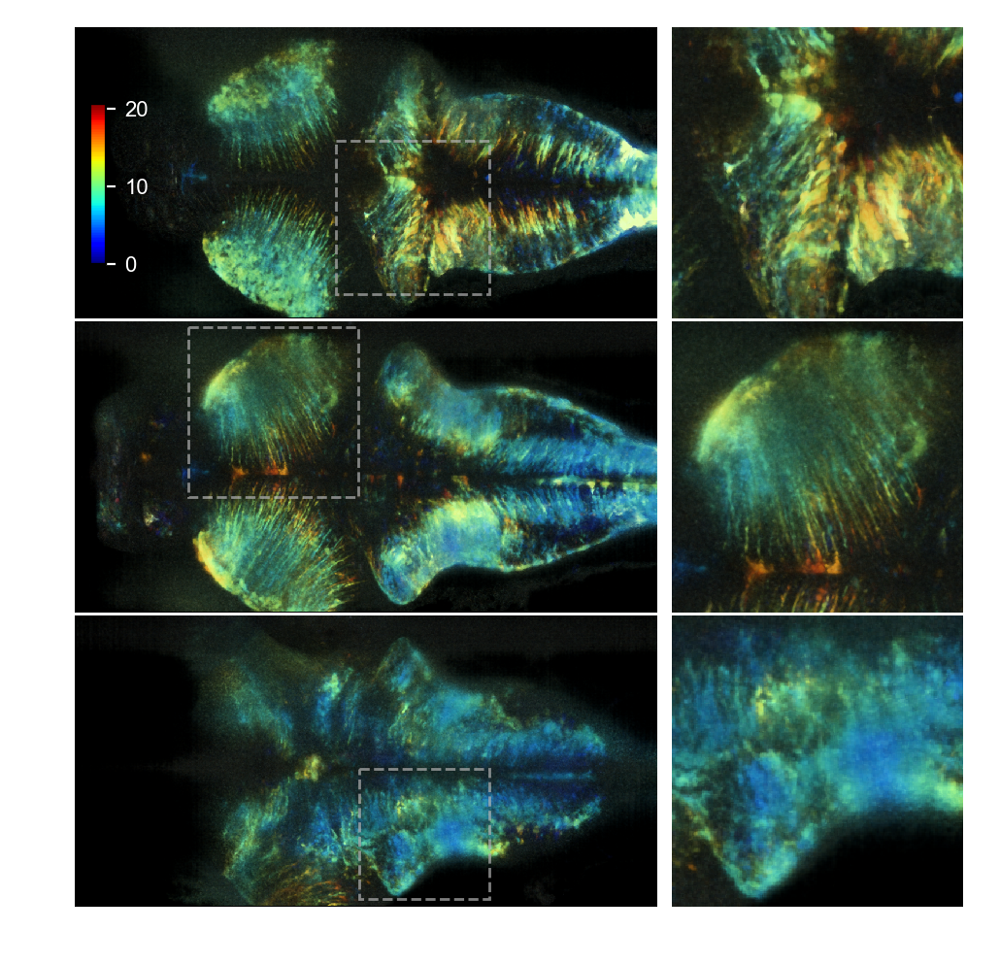

In [206]:
fig, axs = plt.subplots(figsize=(8,2 * len(dps)), dpi=200, nrows=len(dps), ncols=2)
for ind, dp in enumerate(dps):
    axs[ind][0].imshow(dp)
    zoomin = zoomins[ind]
    rect= slices_to_rect(zoomin[1:-1], full_shape=dp.shape[:-1])
    rect.set_fill(False)
    rect.set_edgecolor((.7,.7,.7,.7))
    rect.set_linestyle('--')
    axs[ind][0].add_patch(rect)
    axs[ind][1].imshow(dps[zoomin])
    
[ax.axis('off') for ax in axs.ravel()];

axs_cbar = fig.add_axes((.19,.67,.01,.15))
time_points = np.arange(event_dff[time_slice].shape[0]).reshape(-1,1)  / fs_im
axs_cbar.imshow(np.linspace(0,1,100).reshape(-1,1), extent=(0,2,time_points[0],time_points[-1]), cmap=cmap, origin='lower')
axs_cbar.set_xticks([])
axs_cbar.yaxis.tick_right()
axs_cbar.tick_params(axis='y', colors='w')
plt.subplots_adjust(wspace=-.4,hspace=.01)

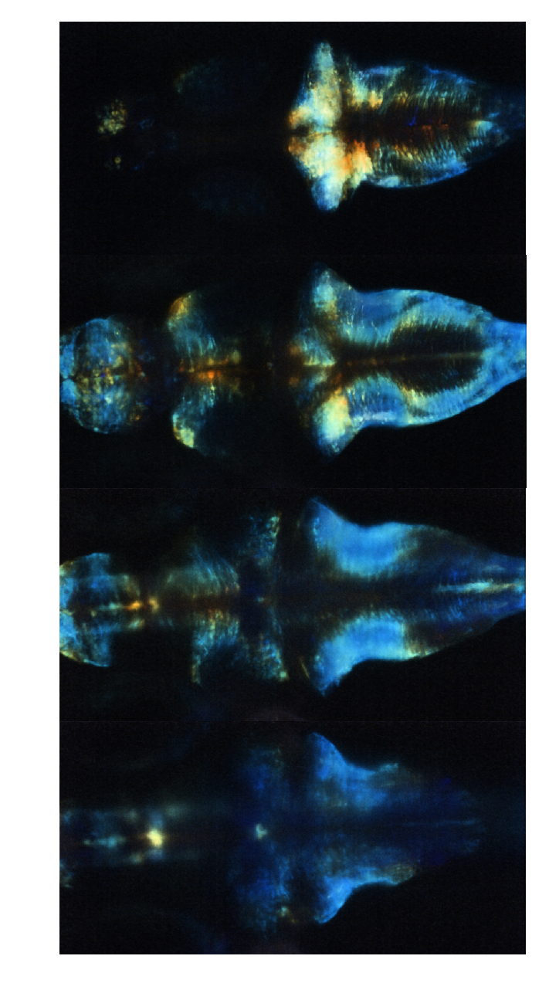

In [271]:
fig, axs = plt.subplots(figsize=(8,8), dpi=200, nrows=len(dps), sharex=True)
[axs[ind].imshow(dp) for ind,dp in enumerate(dps[::-1])]
[ax.axis('off') for ax in axs];
plt.subplots_adjust(wspace=0,hspace=0)

In [ ]:
# show spatial propagation in different brain regions
# show single cells getting lit
# show variability within fish and across fish

In [ ]:
# Show bleeding-through neurons

In [ ]:
fig, axs = plt.subplots(figsize=(12,12), dpi=200, nrows=3)
z = 18
sg = rescale(apply_cmap(linreg_result[0][roi_g[1:]][z], cmap='gray', clim=(0, .03)).astype('float'), out_range=(0,1)) * np.array([1,0,1,1])
sn = rescale(apply_cmap(tx.transform(linreg_result[0][roi_n[1:]][z]), clim=(0, .03), cmap='gray').astype('float'),  out_range=(0,1)) * np.array([0,1,0,1])
axs[0].imshow(sg)
axs[1].imshow(sn)
axs[2].imshow((sg + sn).clip(0,1))

In [158]:
import dask.array as da
dff_dsk = da.from_array(dff, chunks=(1,-1,-1,-1))

In [173]:
dff_dsk_masked = dff_dsk * msk

In [346]:
%%time
g_roi = slice(None), slice(None), slice(256,None), slice(None)
n_roi = slice(None), slice(None), slice(256), slice(None)
mn, mx = -.1, 1.5
bins = rescale(np.geomspace(128, 2 ** 10, 128), out_range=(mn,mx))
hists = []
hists.append(da.stack([da.histogram(d[d != 0], bins=bins)[0] for d in dff_dsk_masked[g_roi]]).compute(scheduler='threads'))
hists.append(da.stack([da.histogram(d[d != 0], bins=bins)[0] for d in dff_dsk_masked[n_roi]]).compute(scheduler='threads'))

CPU times: user 29min 20s, sys: 1min 35s, total: 30min 56s
Wall time: 2min 7s


## Small-scale activity

In [3]:
base_dir = '/nrs/ahrens/davis/data/spim/raw/20160607/5dpf_cy171xcy221_f1_omr_1_20160607_183009/'
reg_path = base_dir.replace('raw', 'proc') + 'reg/regparams_affine.npy'
dset = ZDS(base_dir)
data=dset.data
fs_im = dset.metadata['volume_rate']
aspect = dset.metadata['z_step'] / .40625
try: 
    shifts = -np.load(reg_path)[:,:-1,-1]
except FileNotFoundError:
    shifts = None    
    print('No valid regparams found. They will be estimated')
data.shape

(5000, 37, 2048, 2048)

In [4]:
cluster = get_jobqueue_cluster()
client = Client(cluster)
client

/groups/ahrens/home/bennettd/miniconda/lib/python3.6/site-packages/distributed/deploy/local.py:138: UserWarning: diagnostics_port has been deprecated. Please use `dashboard_address=` instead
  "diagnostics_port has been deprecated. "


Client Scheduler: tcp://10.36.111.11:39974 Dashboard: http://10.36.111.11:8787/status,Cluster Workers: 0 Cores: 0 Memory: 0 B


In [5]:
import flika as flk
flk.start_flika()

Starting flika


Starting flika inside IPython


In [6]:
roi = slice(1000), slice(None), slice(None), slice(None)
data_tx = data[roi].map_blocks(shift_yx, shifts[roi[0]], dtype='float32')
data_filt = data_tx.map_blocks(lambda v: median_filter(v, size=(1,1,3,3)))
ds_xy = 4
data_ds = coarsen(np.mean, data_filt, {2: ds_xy, 3: ds_xy})
rechunked = data_ds.rechunk(chunks=(-1, 'auto','auto','auto'))
data_dff = rechunked.map_blocks(lambda v: mydff(v, fs_im=fs_im), dtype='float32').max(1)

In [7]:
cluster.start_workers(200)
result_dff = data_dff.compute()
cluster.stop_all_jobs()

In [9]:
flk.start_flika()

Starting flika
flika menubar already initialized.
Starting flika inside IPython


In [10]:
flw(result_dff)

/groups/ahrens/home/bennettd/miniconda/lib/python3.6/site-packages/pyqtgraph/imageview/ImageView.py:588: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  data = data[sl]


In [6]:
sample_anat = data[0].compute(scheduler='threads')

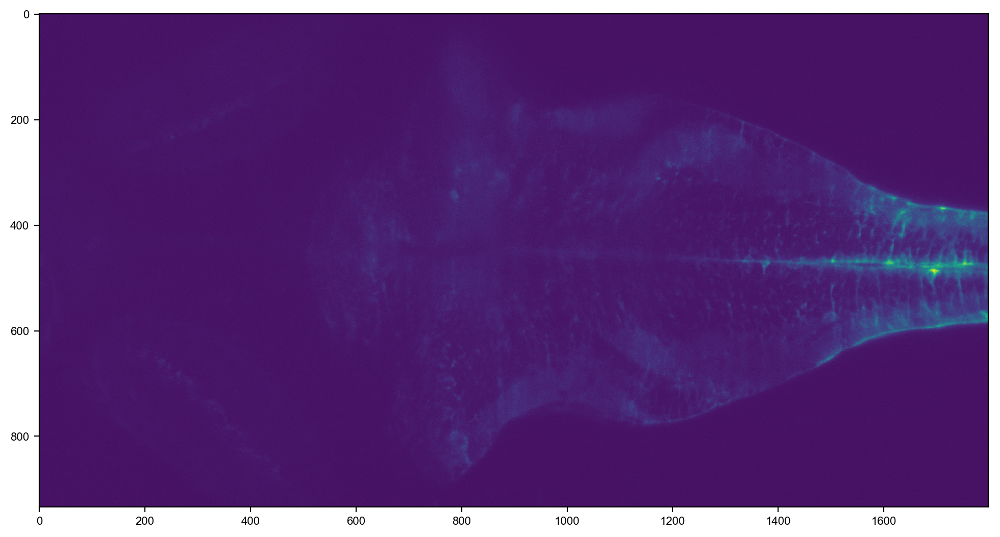

In [548]:
roi = (slice(None), slice(24,25), slice(1114, None), slice(250,None))
fig, axs = plt.subplots(figsize=(12,12), dpi=200)
axs.imshow(sample_anat[roi[1:]].max(0))

In [549]:
data_tx = data[roi].map_blocks(shift_yx, shifts[roi[0]], dtype='float32')
data_filt = data_tx.map_blocks(lambda v: median_filter(v, size=(1,1,3,3)))
ds_xy = 1
data_ds = coarsen(np.mean, data_filt, {2: ds_xy, 3: ds_xy})
rechunked = data_ds.rechunk(chunks=(-1, 'auto','auto','auto'))
data_dff = rechunked.map_blocks(lambda v: mydff(v, fs_im=fs_im), dtype='float32')

In [550]:
data_dff.shape

(5000, 1, 934, 1798)

In [551]:
cluster.start_workers(100)
sample = data_dff.compute().squeeze()
cluster.stop_all_jobs()

In [552]:
sample.shape

(5000, 934, 1798)

In [224]:
flw(sample)

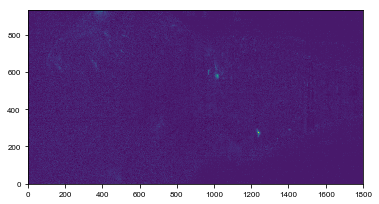

In [553]:
plt.imshow(sample[1406], origin='lower')

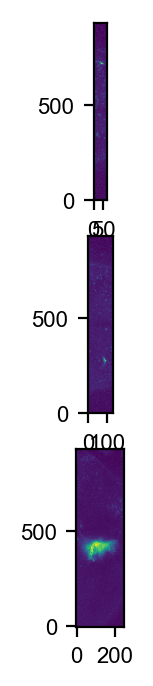

In [556]:
# indices of single-cell events
window = np.arange(-200,200)
t_inds = (2100,1406,4366)
rois_zyx = ((slice(None), slice(None), slice(1330, 1400)),
            (slice(None), slice(None), slice(1150,1280)),
            (slice(None), slice(None), slice(700, 950)))

fig, axs = plt.subplots(nrows=len(t_inds), dpi=200)
[axs[ind].imshow(sample[t + window][rois_zyx[ind]].max(0), origin='lower') for ind, t in enumerate(t_inds)]

In [557]:
data_filt = data_tx.map_blocks(lambda v: median_filter(v, size=(1,1,3,3)))
rois = []
for ind, t in enumerate(t_inds):
    dat = data[t + window, :, roi[2], roi[3]][(slice(None), *rois_zyx[ind])]
    dat_tx = dat.map_blocks(shift_yx, shifts[t+window], dtype='float32')
    dat_filt = dat_tx.map_blocks(lambda v: median_filter(v, size=(1,1,3,3))) - 100
    rois.append(dat_filt)

In [558]:
cluster.start_workers(100)
sample_rs = client.compute(rois, sync=True)
cluster.stop_all_jobs()

In [559]:
bls = [np.percentile(sample_r, 20, axis=0) for sample_r in sample_rs]

In [570]:
sample_r_dffs = [((sample_rs[ind] -bls[ind]) /(bls[ind] + 10)) for ind in range(len(bls))]

Text(49.23076923076923, 86.92412765429032, '50 μm')

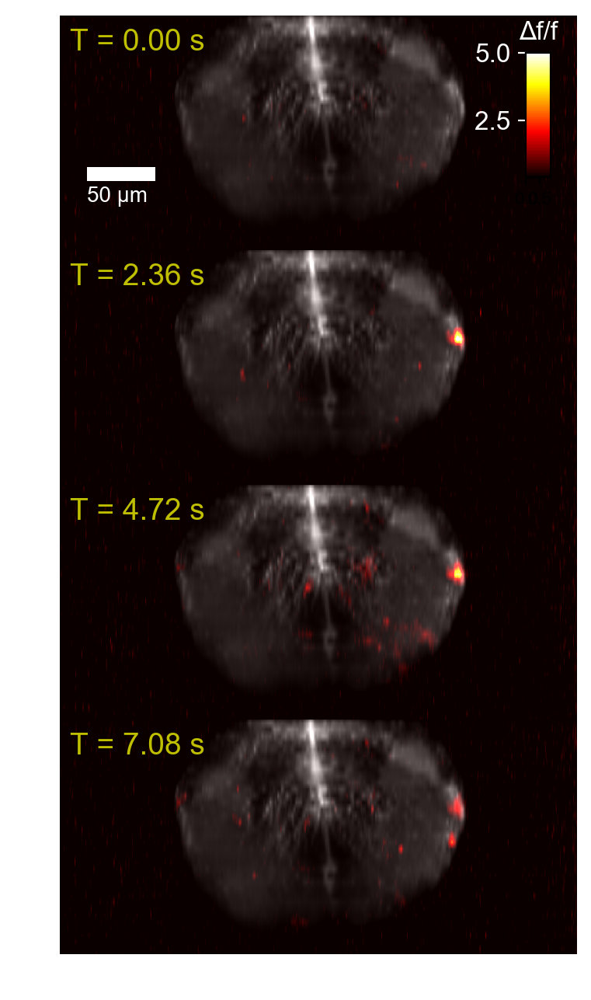

In [634]:
from fish.util.plot import proj_fuse
fontsize=14
textpos = (.02, .85)
ind = 0
dff_clim= (.4,5)
bl = bls[ind]
sample_r_dff= sample_r_dffs[ind]
t_points = np.arange(199,216,5, dtype='int')
t_s = (t_points - t_points[0])/fs_im
fig, axs = plt.subplots(nrows=len(t_points), dpi=200, figsize=(8,8))
crop_x = slice(10,-10)
for ind_t, t_ in enumerate(t_points):
    dff_ims = apply_cmap(proj_fuse(sample_r_dff[t_,:,:,crop_x], np.max, aspect=(int(aspect),1,1)), clim=dff_clim, cmap='hot')
    composite = dff_ims + apply_cmap(proj_fuse(bl[:,:,crop_x], np.max, aspect=(int(aspect),1,1)), clim=(10,200))
    axs[ind_t].imshow(composite[:bl.shape[1]].transpose(1,0,2)[bl.shape[2]:,:], origin='lower', interpolation='None')
    axs[ind_t].text(*textpos, f'T = {t_s[ind_t]:.2f} s', color='y',fontsize=fontsize, transform=axs[ind_t].transAxes)
    axs[ind_t].axis('off')
plt.subplots_adjust(hspace=0)
axs_cbar = fig.add_axes((.68,.75,.02,.1))
axs_cbar.imshow(np.linspace(0,1, 100).reshape(-1,1), extent=(0,np.diff(dff_clim)[0]/5,*dff_clim), cmap='hot', origin='lower')
#axs_cbar.set_yticks(np.linspace(*dff_clim, 4))
axs_cbar.tick_params(axis='y', colors='w', labelsize=12)
axs_cbar.title.set_text('Δf/f')
axs_cbar.title.set_color('w')
axs_cbar.title.set_size(12)

rect,text = scale_bar(20,50, 50,10,(.40625, .40265))
axs[0].add_patch(rect)
axs[0].add_artist(text)

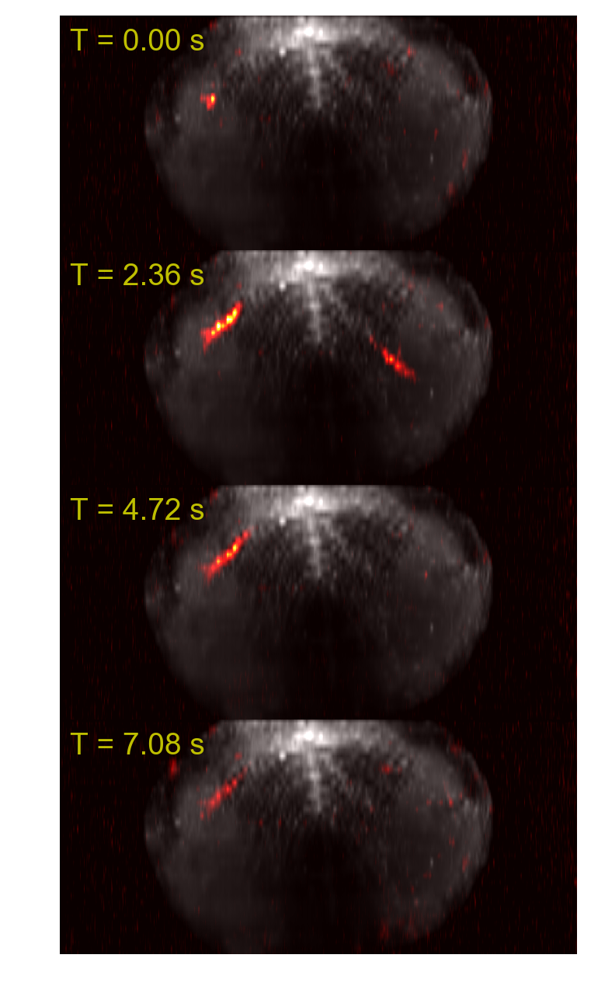

In [588]:
from fish.util.plot import proj_fuse
ind = 1
bl = bls[ind]
sample_r_dff= sample_r_dffs[ind]

t_points = np.arange(199,216,5, dtype='int')
t_s = (t_points - t_points[0])/fs_im
fig, axs = plt.subplots(nrows=len(t_points), dpi=200, figsize=(8,8))
crop_x = slice(10,-10)
for ind_t, t_ in enumerate(t_points):
    dff_ims = apply_cmap(proj_fuse(sample_r_dff[t_,:,:,crop_x], np.max, aspect=(int(aspect),1,1)), clim=(.4,5), cmap='hot')
    composite = dff_ims + apply_cmap(proj_fuse(bl[:,:,crop_x], np.max, aspect=(int(aspect),1,1)), clim=(10,200), cmap='gray')
    axs[ind_t].imshow(composite[:bl.shape[1]].transpose(1,0,2)[bl.shape[2]:,:], origin='lower', interpolation='None')
    axs[ind_t].text(*textpos, f'T = {t_s[ind_t]:.2f} s', color='y', transform=axs[ind_t].transAxes, fontsize=fontsize)
    axs[ind_t].axis('off')
plt.subplots_adjust(hspace=0)

In [638]:
flw(bls[2])

In [690]:
flw(test)

/groups/ahrens/home/bennettd/miniconda/lib/python3.6/site-packages/pyqtgraph/imageview/ImageView.py:588: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  data = data[sl]


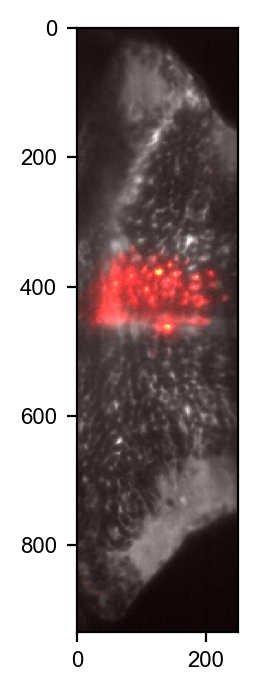

In [720]:
fig, axs = plt.subplots(dpi=200)
t = 244
z = 20
plt.imshow(apply_cmap(sample_r_dffs[2][t,z], cmap='hot', clim=(.2,10)) + apply_cmap(bls[2][z]))

In [637]:
flw(sample_r_dffs[2][205])

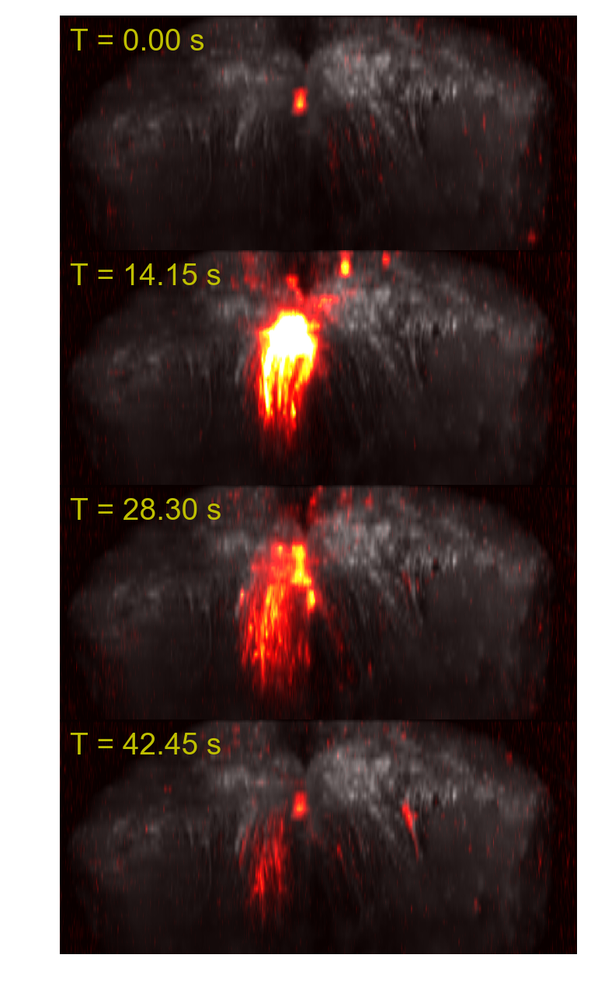

In [589]:
from fish.util.plot import proj_fuse
ind = 2
bl = bls[ind]
sample_r_dff= sample_r_dffs[ind]

t_points = np.arange(203,300,30, dtype='int')
t_s = (t_points - t_points[0])/fs_im
fig, axs = plt.subplots(nrows=len(t_points), dpi=200, figsize=(8,8))
crop_x = slice(10,-10)
for ind_t, t_ in enumerate(t_points):
    dff_ims = apply_cmap(proj_fuse(sample_r_dff[t_,:,:,crop_x], np.max, aspect=(int(aspect),1,1)), clim=(.4,5), cmap='hot')
    composite = dff_ims + apply_cmap(proj_fuse(bl[:,:,crop_x], np.max, aspect=(int(aspect),1,1)), clim=(10,200), cmap='gray')
    axs[ind_t].imshow(composite[:bl.shape[1]].transpose(1,0,2)[bl.shape[2]:,:], origin='lower', interpolation='None')
    axs[ind_t].text(*textpos, f'T = {t_s[ind_t]:.2f} s', color='y', transform=axs[ind_t].transAxes, fontsize=fontsize)
    axs[ind_t].axis('off')
plt.subplots_adjust(hspace=0)

In [25]:
flw(sample_r.max(1))

/groups/ahrens/home/bennettd/miniconda/lib/python3.6/site-packages/pyqtgraph/imageview/ImageView.py:588: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  data = data[sl]


In [16]:
sample_r.shape

(400, 37, 200, 200)

In [19]:
flw(sample_r.max(1))

/groups/ahrens/home/bennettd/miniconda/lib/python3.6/site-packages/pyqtgraph/imageview/ImageView.py:588: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  data = data[sl]


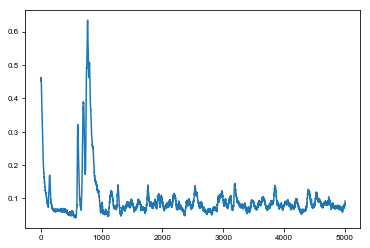

In [15]:
plt.plot(sample.mean((1,2,3)))

In [13]:
plr_t =  slice(1200,2400)
z = 0
roi_plt = plr_t, slice(z,z+1), slice(None), slice(800,1500)
pln = sample[roi_plt].squeeze()

In [28]:
proj_cmap = 'rainbow'
dff_dpth = mdp(pln.clip(.15, 1), 0, proj_cmap)
anat_gray = apply_cmap(sample_anat[roi[1:]][:,::ds_xy,::ds_xy][roi_plt[1:]].squeeze(),'gray')
anat_gray_fl = rescale(anat_gray.astype('float'), out_range=(0,1)) * np.array([.5,.5,.5,1])
composite = (dff_dpth + anat_gray_fl)
subr = slice(400,700),slice(400,-100)

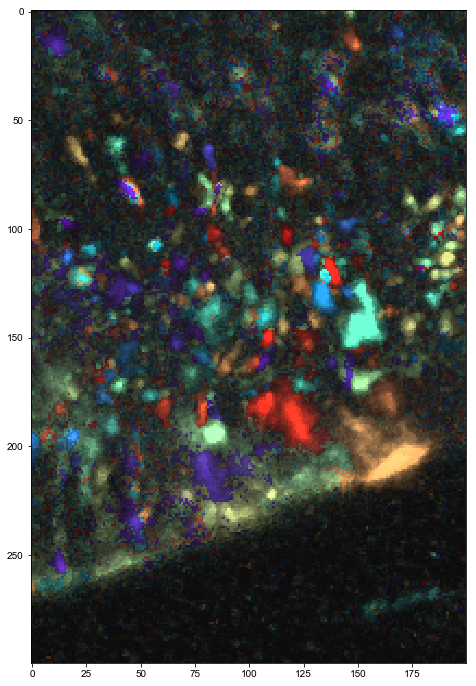

In [31]:
fig, axs = plt.subplots(figsize=(12,12))
plt.imshow(composite[subr])

In [17]:
out_ptfile_fname = '../../data/ch2/sparse_roi_pts.pickle'

In [60]:
win = flw(composite[subr].transpose(1,0,2))

In [96]:
pts = [r.getPoints().astype('int') for r in win.rois]
# save points
from pickle import dump
with open(out_ptfile_fname,'wb') as f:
    dump(pts, f)

In [18]:
# load points
from pickle import load
with open(out_ptfile_fname, 'rb') as f:
    pts = load(f)

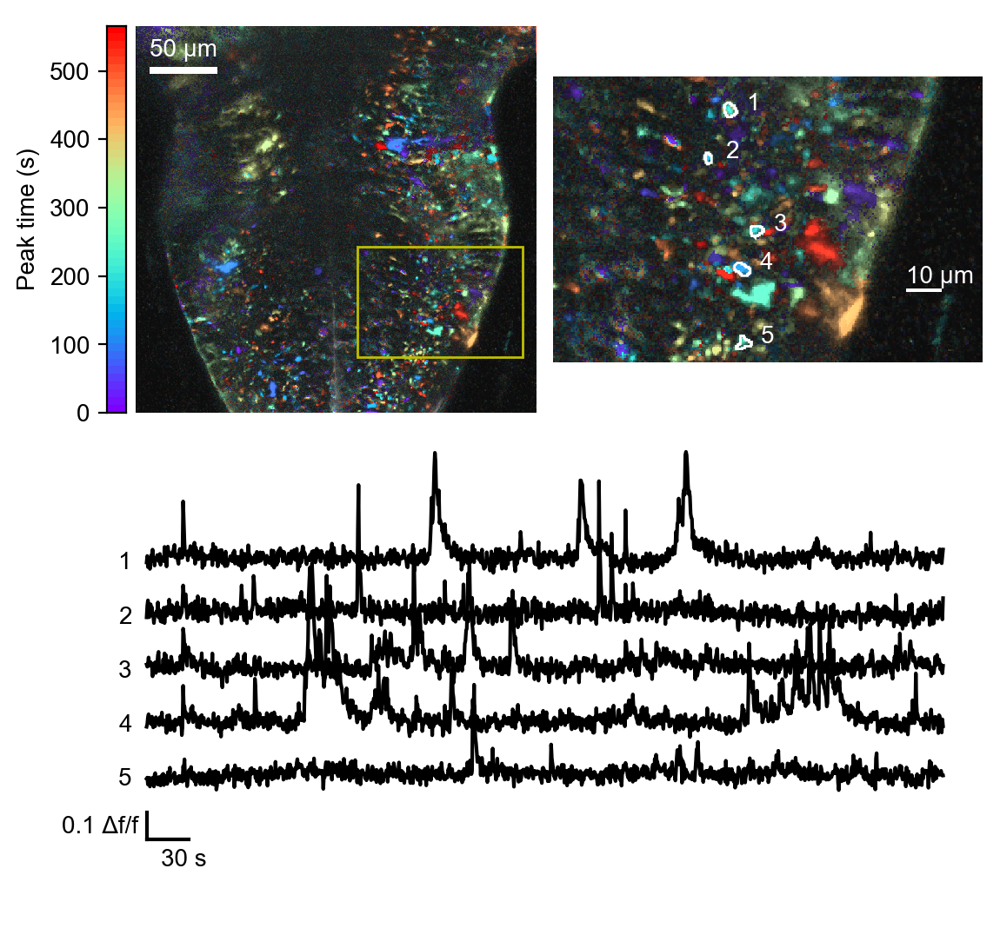

In [40]:
from matplotlib.gridspec import GridSpec
from matplotlib.patches import Polygon
from mpl_toolkits.axes_grid1 import make_axes_locatable

fig = plt.figure(figsize=(6.5, 6.5), dpi=200)
gs = GridSpec(nrows=2,ncols=2, height_ratios=(1,1))

axs = []
axs.append(fig.add_subplot(gs[0,0]))
axs.append(fig.add_subplot(gs[0,1]))
axs.append(fig.add_subplot(gs[1,:]))
rect = slices_to_rect(subr[::-1], composite.shape[:2][::-1], fill=False, edgecolor='y')
ts_data = pln[(slice(None), *subr)].transpose(0,2,1)

[axs[0].add_artist(scb) for scb in scale_bar(10,30,50,5,(.40625,.40625))]
[axs[1].add_artist(scb) for scb in scale_bar(100,60,10,1,(.40625,.40625))]

polys = [Polygon(p[:,::-1], alpha=1, facecolor='w', edgecolor='w', fill=False) for p in pts]
[axs[1].add_patch(p) for p in polys]
[axs[1].text(p.mean(0)[1] + 12, p.mean(0)[0], ind + 1, color='w') for ind,p in enumerate(pts)]

axs[0].add_patch(rect)
axs[0].set_facecolor('k')
axs[0].imshow(composite.transpose(1,0,2))
divider = make_axes_locatable(axs[0])

cax = divider.append_axes("left", size="5%", pad=0.05)
cax.imshow(np.linspace(1,0).reshape(-1,1), cmap=proj_cmap, extent=(0,pln.shape[0]/fs_im/20,0,pln.shape[0]/fs_im))
#cax.yaxis.tick_right()
#cax.yaxis.set_label_position('right')
cax.xaxis.set_visible(False)
cax.set_ylabel('Peak time (s)')

axs[1].imshow(composite[subr].transpose(1,0,2))
offset_scale = 1/5
[axs[2].plot(np.arange(ts_data.shape[0]) / fs_im, ts_data[:,p[:,0], p[:,1]].mean(1) - ind * offset_scale, label=ind, color='k') for ind,p in enumerate(pts)]; 
[axs[2].text(-20,-offset_scale * ind, ind+1) for ind in range(len(pts))];
axs[2].set_xlabel('Time (s)')
scb_x_len = 30
scb_y_len = .1
scb_x = np.array([0, scb_x_len])
scb_y = np.array([0, scb_y_len]) - 1
axs[2].plot(2*[scb_x[0]],scb_y, color='k', zorder=0)
axs[2].plot(scb_x, 2*[scb_y[0]], color='k', zorder=0)
axs[2].text(scb_x[0]-60, scb_y[0] + (scb_y_len)/4, f'{(scb_y_len):.0} Δf/f')
axs[2].text(scb_x[0] + scb_x_len/3, scb_y[0] - .1, f'{(scb_x_len):} s')
[ax.axis('off') for ax in axs];

fig_fname = f'{dset.exp_name}_sparse_glial_activity.pdf'
plt.subplots_adjust(hspace=0)
[plt.subplots_adjust(wspace=.04)]
plt.savefig(fig_dir + fig_fname)